In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:

from matplotlib import pyplot as plt
from matplotlib import rcParams
import numpy as np
from pathlib import Path
import pandas as pd
import seaborn as sns
from tqdm.notebook import tqdm
import warnings

In [3]:
rcParams['figure.figsize'] = (16, 8)
plt.style.use('fivethirtyeight')
pd.set_option('max_columns', 100)
pd.set_option("display.precision", 4)
warnings.simplefilter('ignore')

<h4>학습데이터 로드</h4>

In [9]:
ls "./DACON"

 C 드라이브의 볼륨: SSD
 볼륨 일련 번호: BCA4-98AF

 C:\Users\inhoinno\DACON 디렉터리

2020-09-10  오후 12:50    <DIR>          .
2020-09-10  오후 12:50    <DIR>          ..
2020-09-10  오후 12:55                43 .gitattributes
2020-09-09  오후 11:59    <DIR>          .ipynb_checkpoints
2020-09-10  오후 12:42       132,988,145 feature.csv
2020-09-10  오후 12:36         2,897,812 pandasdemo.ipynb
2020-09-10  오후 12:42           800,010 sample_submission.csv
2020-09-10  오후 12:42        18,936,246 test.csv
2020-09-10  오후 12:42        76,278,443 train.csv
2020-09-10  오후 12:37    <DIR>          단국대천체모형
               6개 파일         231,900,699 바이트
               4개 디렉터리  114,112,712,704 바이트 남음


In [20]:
data_dir = Path('./DACON')
trn_file = data_dir / 'train.csv'
tst_file = data_dir / 'test.csv'
feature_file = data_dir / 'feature.csv'
seed = 42


In [47]:
train = pd.read_csv(trn_file)
test = pd.read_csv(tst_file)
feature= pd.concat([train,test], axis =0)

print(train.info())
print(test.info())
print(train.shape)
train.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320000 entries, 0 to 319999
Data columns (total 20 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   id         320000 non-null  int64  
 1   u          320000 non-null  float64
 2   g          320000 non-null  float64
 3   r          320000 non-null  float64
 4   i          320000 non-null  float64
 5   z          320000 non-null  float64
 6   redshift   320000 non-null  float64
 7   dered_u    320000 non-null  float64
 8   dered_g    320000 non-null  float64
 9   dered_r    320000 non-null  float64
 10  dered_i    320000 non-null  float64
 11  dered_z    320000 non-null  float64
 12  nObserve   320000 non-null  int64  
 13  nDetect    320000 non-null  int64  
 14  airmass_u  320000 non-null  float64
 15  airmass_g  320000 non-null  float64
 16  airmass_r  320000 non-null  float64
 17  airmass_i  320000 non-null  float64
 18  airmass_z  320000 non-null  float64
 19  class      320000 non-n

,id,u,g,r,i,z,redshift,dered_u,dered_g,dered_r,dered_i,dered_z,nObserve,nDetect,airmass_u,airmass_g,airmass_r,airmass_i,airmass_z,class
0,0,23.2640,20.3368,19.0095,17.6724,16.9396,-8.1086e-05,23.1243,20.2578,18.9551,17.6321,16.9089,18,18,1.1898,1.1907,1.1890,1.1894,1.1902,0
1,1,15.0521,14.0620,13.4524,13.2684,13.1689,4.5061e-03,14.9664,14.0045,13.4114,13.2363,13.1347,1,1,1.2533,1.2578,1.2488,1.2510,1.2555,1
2,2,16.7864,15.8254,15.5363,15.3935,15.3500,4.7198e-04,16.6076,15.6866,15.4400,15.3217,15.2961,2,2,1.0225,1.0241,1.0210,1.0217,1.0233,0
3,3,25.6606,21.1887,20.2212,19.8949,19.6346,5.8143e-06,25.3536,20.9947,20.0873,19.7947,19.5552,4,3,1.2054,1.2061,1.2049,1.2051,1.2057,0
4,4,24.4534,20.6992,19.0424,18.3242,17.9826,-3.3247e-05,23.7714,20.4338,18.8630,18.1903,17.8759,13,12,1.1939,1.1943,1.1937,1.1938,1.1941,0


In [48]:
feature.describe()

,id,u,g,r,i,z,redshift,dered_u,dered_g,dered_r,dered_i,dered_z,nObserve,nDetect,airmass_u,airmass_g,airmass_r,airmass_i,airmass_z,class
count,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,4.0000e+05,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,400000.0000,320000.0000
mean,199999.5000,19.8539,18.3889,17.7366,17.2007,16.9299,5.8663e-02,19.6301,18.2344,17.6162,17.1654,16.8695,6.3361,6.1426,1.1758,1.1766,1.1752,1.1755,1.1762,1.1163
std,115470.1982,1.9473,27.8367,1.4687,47.0161,52.2879,5.3757e-01,1.9231,15.9262,1.4736,22.4364,35.4365,8.8795,8.5515,0.1163,0.1181,0.1147,0.1155,0.1172,0.9235
min,0.0000,-17.6875,-17555.3656,-5.4387,-23955.8178,-23955.8178,-1.6605e+02,-42.8375,-9999.0000,-16.3802,-9999.0000,-9999.0000,1.0000,1.0000,1.0001,1.0000,1.0002,1.0001,1.0000,0.0000
25%,99999.7500,18.7248,17.4754,16.8782,16.5241,16.2888,3.5184e-05,18.5651,17.3492,16.7879,16.4537,16.2334,1.0000,1.0000,1.0882,1.0884,1.0877,1.0880,1.0883,0.0000
50%,199999.5000,19.4208,18.1414,17.5267,17.1510,16.9184,4.7127e-02,19.2652,18.0229,17.4444,17.0881,16.8701,2.0000,2.0000,1.1793,1.1792,1.1794,1.1794,1.1793,1.0000
75%,299999.2500,20.4326,19.0745,18.4289,18.0074,17.7297,9.4629e-02,20.1981,18.8902,18.2922,17.9075,17.6560,5.0000,5.0000,1.2276,1.2260,1.2293,1.2286,1.2268,2.0000
max,399999.0000,58.6233,94.3591,72.0097,50.1641,6976.3922,6.2323e+01,30.8899,30.9529,31.9572,32.0162,30.7813,44.0000,42.0000,2.0508,2.0803,2.0221,2.0363,2.0654,2.0000


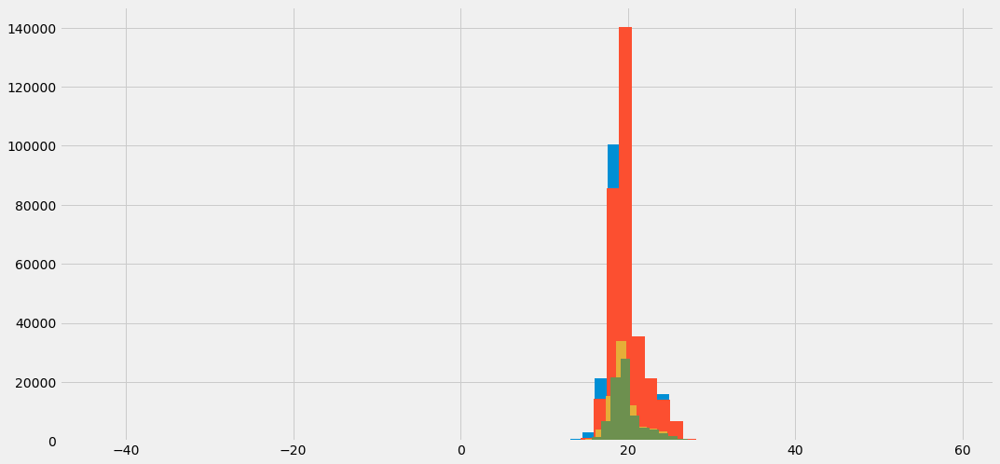

In [35]:
train.dered_u.hist(bins=50)
train.u.hist(bins=50)
test.dered_u.hist(bins=50)
test.u.hist(bins=50)

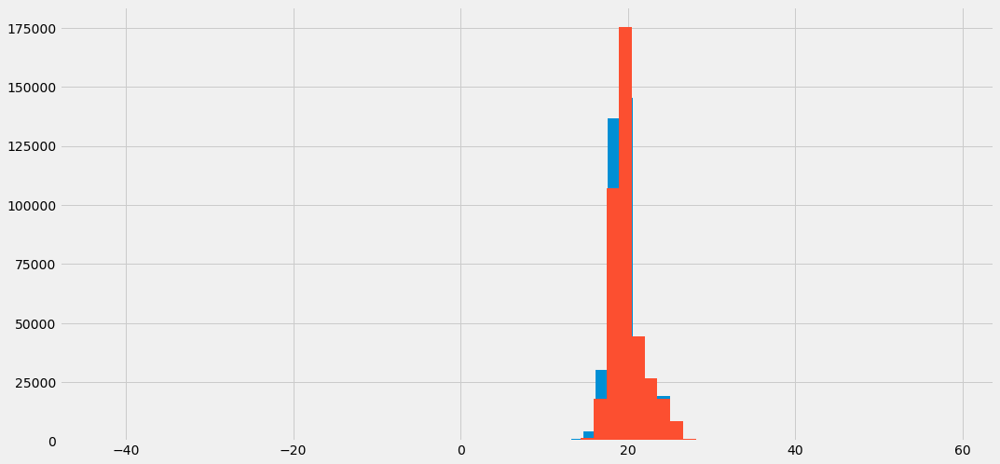

In [37]:
traintest.dered_u.hist(bins=50)
traintest.u.hist(bins=50)

In [39]:
target_col = 'u'
pred_col = 'pred'
num_cols = [x for x in train.columns if train[x].dtype in [np.int64, np.float64] and x != target_col]
print(num_cols)

['id', 'g', 'r', 'i', 'z', 'redshift', 'dered_u', 'dered_g', 'dered_r', 'dered_i', 'dered_z', 'nObserve', 'nDetect', 'airmass_u', 'airmass_g', 'airmass_r', 'airmass_i', 'airmass_z', 'class']


In [40]:
sns.pairplot(data=train, vars=num_cols + [target_col], size=5)

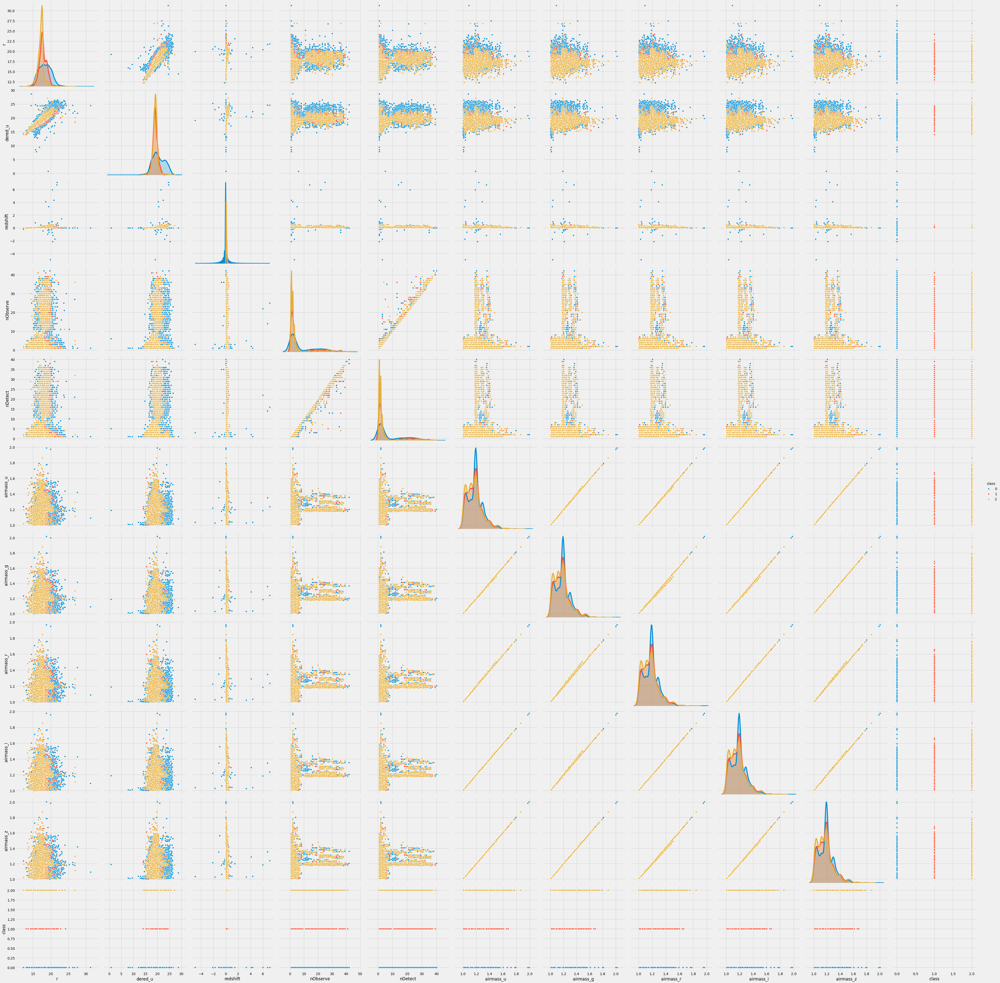

In [46]:
sns.pairplot(train.sample(n=10000), vars=['r','dered_u','redshift', 'nObserve', 'nDetect', 'airmass_u', 'airmass_g', 'airmass_r', 'airmass_i', 'airmass_z', 'class'], hue='class', size=5)
